<h1 align="center">UST, Zewail City</h1>
<h2 align="center">CIE 555 (Spring 2023)</h2>
<h2 align="center">Project #4</h2>


#Task [10 points]

Use two RNN models (one with simple vanilla RNN cells, other with GRU cells) to predict the temperature 1 hour into the future given the past 12 hours:


https://keras.io/api/layers/recurrent_layers/simple_rnn/

https://keras.io/api/layers/recurrent_layers/gru/

- In this task you're required to split the data into training, validation and test. [2 points] Use the test set to test the generalization error of your models.[3 points each]
- Use mean absolute error as an evaluation metric [1 point]
- Compare the performance of the two models and comment on the results [1 points]
- At least one of them MUST contain more than a single RNN layer; {Hint: check return_sequence parameter in the RNN layers documentation to help you in that.}


##Bonus[2 point]
- Predict the test set, and plot a predicted 500-1000 labels vs. the actual labels.

#Installation and Import statements

In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [ ]:
import os
import datetime

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import pandas_profiling as pp
from pandas_profiling import ProfileReport
from tensorflow import keras

from zipfile import ZipFile

<ipython-input-3-c29dc2c7466e>:12: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pp


#Dataset

* In this lab we will work with the weather forecasting dataset.
* This dataset contains 14 different features such as air temperature, atmospheric pressure, and humidity.
* These were collected every 10 minutes, beginning in 2003.
* We will use only the data collected between 2009 and 2016.

In [ ]:
uri = "https://storage.googleapis.com/tensorflow/tf-keras-datasets/jena_climate_2009_2016.csv.zip"
zip_path = keras.utils.get_file(origin=uri, fname="jena_climate_2009_2016.csv.zip")
zip_file = ZipFile(zip_path)
zip_file.extractall()
csv_path = "jena_climate_2009_2016.csv"

13568290/13568290 [==============================] - 2s 0us/step


In [ ]:
df = pd.read_csv(csv_path)
df.head()

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.1,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3


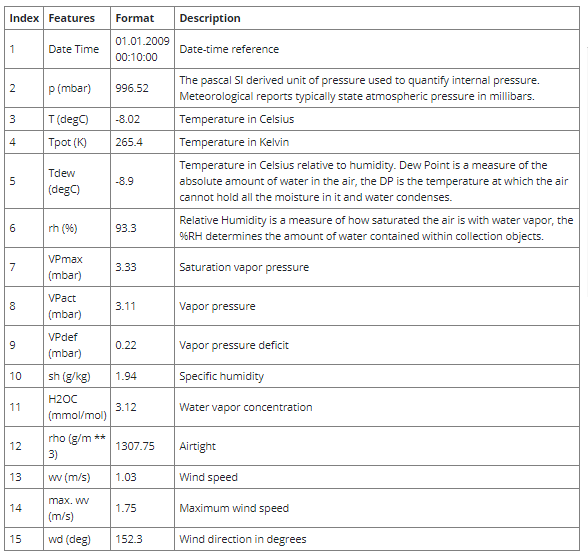

In [ ]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#Data Cleaning and Feature Engineering

##Drop some of the highly correlated features

We'll drop the following features:
* Tpot (K)
* Tdew (degC)
* rh
* VPact (mbar)
* max. wv (m/s)
* H2OC

In [ ]:
df= df.drop(columns=['Tpot (K)','Tdew (degC)','rh (%)','VPact (mbar)','max. wv (m/s)', 'H2OC (mmol/mol)'])
df.head()

,Date Time,p (mbar),T (degC),VPmax (mbar),VPdef (mbar),sh (g/kg),rho (g/m**3),wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,3.33,0.22,1.94,1307.75,1.03,152.3
1,01.01.2009 00:20:00,996.57,-8.41,3.23,0.21,1.89,1309.80,0.72,136.1
2,01.01.2009 00:30:00,996.53,-8.51,3.21,0.20,1.88,1310.24,0.19,171.6
3,01.01.2009 00:40:00,996.51,-8.31,3.26,0.19,1.92,1309.19,0.34,198.0
4,01.01.2009 00:50:00,996.51,-8.27,3.27,0.19,1.92,1309.00,0.32,214.3


In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
p (mbar),420551.0,989.212776,8.358481,913.60,984.20,989.58,994.72,1015.35
T (degC),420551.0,9.450147,8.423365,-23.01,3.36,9.42,15.47,37.28
VPmax (mbar),420551.0,13.576251,7.739020,0.95,7.78,11.82,17.60,63.77
VPdef (mbar),420551.0,4.042412,4.896851,0.00,0.87,2.19,5.30,46.01
sh (g/kg),420551.0,6.022408,2.656139,0.50,3.92,5.59,7.80,18.13
rho (g/m**3),420551.0,1216.062748,39.975208,1059.45,1187.49,1213.79,1242.77,1393.54
wv (m/s),420551.0,1.702224,65.446714,-9999.00,0.99,1.76,2.86,28.49
wd (deg),420551.0,174.743738,86.681693,0.00,124.90,198.10,234.10,360.00


##Wind Velocity Min Value

One thing that should stand out is the min value of the wind velocity, wv (m/s) column. This -9999 is likely erroneous. There's a separate wind direction column, so the velocity should be >=0. Replace it with zeros:

In [ ]:
bad_wv = df['wv (m/s)'] == -9999.0
df['wv (m/s)'][bad_wv] = 0.0
df.describe().transpose()

<ipython-input-9-f52ecf5e8df0>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['wv (m/s)'][bad_wv] = 0.0


,count,mean,std,min,25%,50%,75%,max
p (mbar),420551.0,989.212776,8.358481,913.60,984.20,989.58,994.72,1015.35
T (degC),420551.0,9.450147,8.423365,-23.01,3.36,9.42,15.47,37.28
VPmax (mbar),420551.0,13.576251,7.739020,0.95,7.78,11.82,17.60,63.77
VPdef (mbar),420551.0,4.042412,4.896851,0.00,0.87,2.19,5.30,46.01
sh (g/kg),420551.0,6.022408,2.656139,0.50,3.92,5.59,7.80,18.13
rho (g/m**3),420551.0,1216.062748,39.975208,1059.45,1187.49,1213.79,1242.77,1393.54
wv (m/s),420551.0,2.130191,1.542334,0.00,0.99,1.76,2.86,28.49
wd (deg),420551.0,174.743738,86.681693,0.00,124.90,198.10,234.10,360.00


##Wind Direction

The last column of the data, wd (deg), gives the wind direction in units of degrees. Angles do not make good model inputs, 360° and 0° should be close to each other, and wrap around smoothly. It will be easier for the model to interpret if you convert the wind direction and velocity columns to a wind vector:


In [ ]:
wv = df.pop('wv (m/s)')

# Convert to radians.
wd_rad = df.pop('wd (deg)')*np.pi/180

# Calculate the wind x and y components.
df['Wx'] = wv*np.cos(wd_rad)
df['Wy'] = wv*np.sin(wd_rad)
df.head()

,Date Time,p (mbar),T (degC),VPmax (mbar),VPdef (mbar),sh (g/kg),rho (g/m**3),Wx,Wy
0,01.01.2009 00:10:00,996.52,-8.02,3.33,0.22,1.94,1307.75,-0.911955,0.478787
1,01.01.2009 00:20:00,996.57,-8.41,3.23,0.21,1.89,1309.80,-0.518797,0.499249
2,01.01.2009 00:30:00,996.53,-8.51,3.21,0.20,1.88,1310.24,-0.187962,0.027756
3,01.01.2009 00:40:00,996.51,-8.31,3.26,0.19,1.92,1309.19,-0.323359,-0.105066
4,01.01.2009 00:50:00,996.51,-8.27,3.27,0.19,1.92,1309.00,-0.264351,-0.180328


In [ ]:
features= df.drop(columns='Date Time')
features.index=df['Date Time']
features.head()

,p (mbar),T (degC),VPmax (mbar),VPdef (mbar),sh (g/kg),rho (g/m**3),Wx,Wy
Date Time,,,,,,,,
01.01.2009 00:10:00,996.52,-8.02,3.33,0.22,1.94,1307.75,-0.911955,0.478787
01.01.2009 00:20:00,996.57,-8.41,3.23,0.21,1.89,1309.80,-0.518797,0.499249
01.01.2009 00:30:00,996.53,-8.51,3.21,0.20,1.88,1310.24,-0.187962,0.027756
01.01.2009 00:40:00,996.51,-8.31,3.26,0.19,1.92,1309.19,-0.323359,-0.105066
01.01.2009 00:50:00,996.51,-8.27,3.27,0.19,1.92,1309.00,-0.264351,-0.180328


##Split the data

* Label column name: ['T (degC)']

* Here we are picking ~300,000 data points for training. Observation is recorded every 10 mins, that means 6 times per hour. We will resample one point per hour since no drastic change is expected within 60 minutes. We do this via the sampling_rate argument in timeseries_dataset_from_array utility.

* We are tracking data from past 72 timestamps (72/6=12 hours). This data will be used to predict the temperature after 6 timestamps (6/6=1 hour).

In [ ]:
def normalize(data, train_split):
    data_mean = data[:train_split].mean(axis=0)
    data_std = data[:train_split].std(axis=0)
    return (data - data_mean) / data_std

In [ ]:
split_fraction = 0.715
train_split = int(split_fraction * int(df.shape[0]))
print("Train split: ", train_split)
step = 6
past = 72
future = 6
learning_rate = 0.001
batch_size = 256
epochs = 10

features = normalize(features.values, train_split)
features = pd.DataFrame(features)
features.head()

Train split:  300693


,0,1,2,3,4,5,6,7
0,0.955451,-2.000020,-1.319782,-0.788479,-1.500927,2.237658,-0.160517,0.560861
1,0.961528,-2.045185,-1.332806,-0.790561,-1.519521,2.287838,0.035423,0.574009
2,0.956666,-2.056766,-1.335410,-0.792642,-1.523239,2.298608,0.200303,0.271053
3,0.954236,-2.033604,-1.328898,-0.794724,-1.508364,2.272906,0.132824,0.185709
4,0.954236,-2.028972,-1.327596,-0.794724,-1.508364,2.268256,0.162232,0.137350


In [ ]:
train_data = features.loc[0 : train_split - 1]
val_data = features.loc[train_split:]

print("Train data shape: ", train_data.shape)
print("Validation data shape: ", val_data.shape)

Train data shape:  (300693, 8)
Validation data shape:  (119858, 8)


In [ ]:
start = past + future
print("Start= ", start)
end = start + train_split
print("End= ", end)
x_train = train_data.values
print(x_train.shape)
y_train = features.iloc[start:end][[1]]

print(y_train.shape)
sequence_length = int(past / step)
print("Sequence length= ", sequence_length)

Start=  78
End=  300771
(300693, 8)
(300693, 1)
Sequence length=  12


In [ ]:
dataset_train = keras.preprocessing.timeseries_dataset_from_array(
    x_train,
    y_train,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

In [ ]:
for batch in dataset_train.take(1):
    inputs, targets = batch

print("Input shape:", inputs.numpy().shape)
print("Target shape:", targets.numpy().shape)

Input shape: (256, 12, 8)
Target shape: (256, 1)


##Validation data

We'll exclude the last 12 hours from the validation data because we don't have a label for them

In [ ]:
x_end = len(val_data) - past - future

label_start = train_split + past + future

x_val = val_data.iloc[:x_end].values
y_val = features.iloc[label_start:][[1]]

dataset_val = keras.preprocessing.timeseries_dataset_from_array(
    x_val,
    y_val,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

In [ ]:
for batch in dataset_train.take(1):
    inputs, targets = batch

print("Input shape:", inputs.numpy().shape)
print("Target shape:", targets.numpy().shape)

Input shape: (256, 12, 8)
Target shape: (256, 1)


#Test Data

In [ ]:
test_data = normalize(features.values[train_split:], train_split)
x_test = test_data[:-past]
y_test = features.iloc[train_split + past + future:][[1]]

dataset_test = keras.preprocessing.timeseries_dataset_from_array(
    x_test,
    y_test,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

In [ ]:
for batch in dataset_test.take(1):
    inputs, targets = batch

print("Input shape:", inputs.numpy().shape)
print("Target shape:", targets.numpy().shape)

Input shape: (256, 12, 8)
Target shape: (256, 1)


##Simple RNN

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.SimpleRNN(32, return_sequences=True, input_shape=(inputs.shape[1], inputs.shape[2])),
    tf.keras.layers.SimpleRNN(16),
    tf.keras.layers.Dense(1)
])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_1 (SimpleRNN)    (None, 12, 32)            1312      
                                                                 
 simple_rnn_2 (SimpleRNN)    (None, 16)                784       
                                                                 
 dense_1 (Dense)             (None, 1)                 17        
                                                                 
Total params: 2,113
Trainable params: 2,113
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.compile(optimizer='adam', loss='mae')
history= model.fit(dataset_train, epochs=10, validation_data=dataset_val)

Epoch 1/10
1175/1175 [==============================] - 81s 66ms/step - loss: 0.2049 - val_loss: 0.1676
Epoch 2/10
1175/1175 [==============================] - 78s 67ms/step - loss: 0.1323 - val_loss: 0.1534
Epoch 3/10
1175/1175 [==============================] - 84s 72ms/step - loss: 0.1256 - val_loss: 0.1308
Epoch 4/10
1175/1175 [==============================] - 79s 67ms/step - loss: 0.1226 - val_loss: 0.1319
Epoch 5/10
1175/1175 [==============================] - 78s 66ms/step - loss: 0.1192 - val_loss: 0.1340
Epoch 6/10
1175/1175 [==============================] - 77s 65ms/step - loss: 0.1173 - val_loss: 0.1329
Epoch 7/10
1175/1175 [==============================] - 80s 68ms/step - loss: 0.1161 - val_loss: 0.1271
Epoch 8/10
1175/1175 [==============================] - 77s 66ms/step - loss: 0.1175 - val_loss: 0.1237
Epoch 9/10
1175/1175 [==============================] - 79s 67ms/step - loss: 0.1152 - val_loss: 0.1238
Epoch 10/10
1175/1175 [==============================] - 79s 68m

8/8 [==============================] - 1s 8ms/step


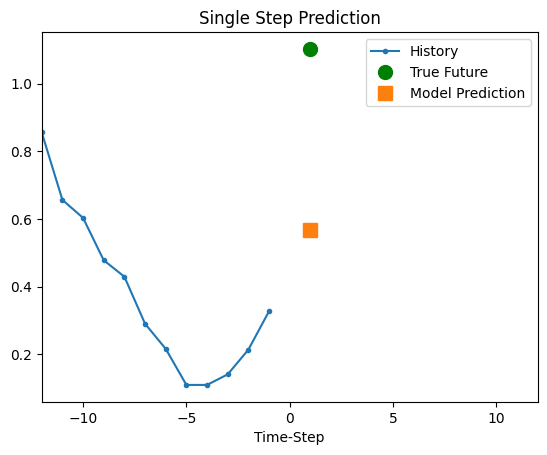

8/8 [==============================] - 0s 7ms/step


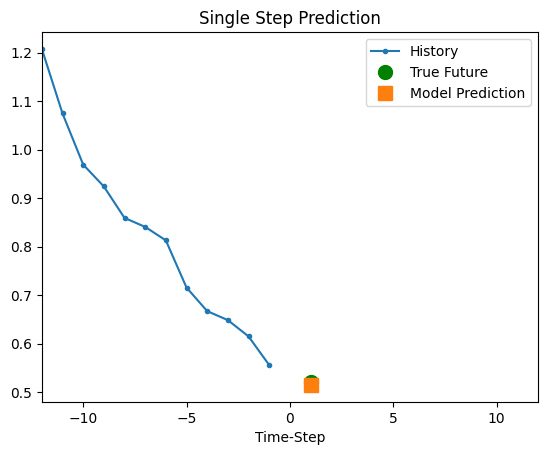

8/8 [==============================] - 0s 6ms/step


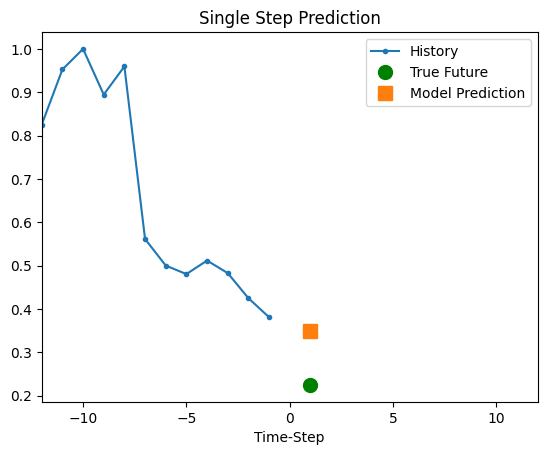

8/8 [==============================] - 0s 6ms/step


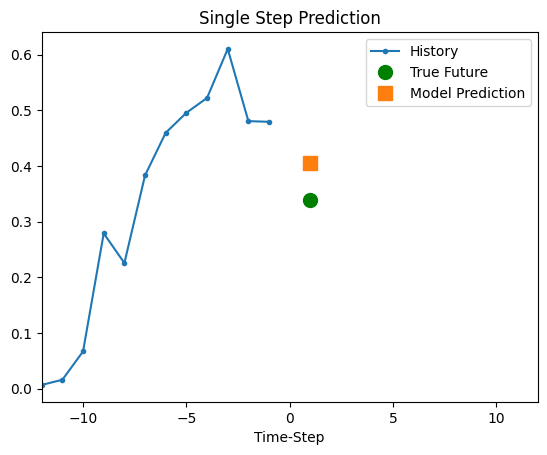

8/8 [==============================] - 0s 5ms/step


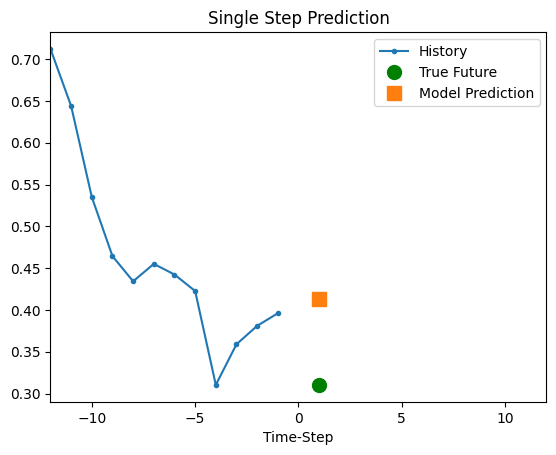

In [ ]:
%matplotlib inline
def show_plot(plot_data, delta, title):
    labels = ["History", "True Future", "Model Prediction"]
    marker = [".-", "go", "s"]
    time_steps = list(range(-(plot_data[0].shape[0]), 0))

    plt.title(title)
    for i, val in enumerate(plot_data):
      if i:
        plt.plot(delta, plot_data[i], marker[i], markersize=10, label=labels[i])
      else:
        plt.plot(time_steps, plot_data[i].flatten(), marker[i], label=labels[i])
    plt.legend()
    plt.xlim([time_steps[0], (delta + 5) * 2])
    plt.xlabel("Time-Step")
    plt.show()
    return


for x, y in dataset_val.take(5):
    show_plot(
        [x[0][:, 1].numpy(), y[0].numpy(), model.predict(x)[0]],
        1,
        "Single Step Prediction",
    )

##GRU

In [ ]:
inputs = keras.layers.Input(shape=(inputs.shape[1], inputs.shape[2]))
gru = tf.keras.layers.GRU(32)(inputs)
outputs = keras.layers.Dense(1)(gru)
model2 = keras.Model(inputs=inputs, outputs=outputs)
model2.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mae")
model2.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 12, 8)]           0         
                                                                 
 gru (GRU)                   (None, 32)                4032      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 4,065
Trainable params: 4,065
Non-trainable params: 0
_________________________________________________________________


In [ ]:
path_checkpoint2 = "model_checkpoint2.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint2,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = model.fit(
    dataset_train,
    epochs=epochs,
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)

Epoch 1/10
1175/1175 [==============================] - ETA: 0s - loss: 0.1152
Epoch 1: val_loss improved from inf to 0.12528, saving model to model_checkpoint2.h5
1175/1175 [==============================] - 77s 66ms/step - loss: 0.1152 - val_loss: 0.1253
Epoch 2/10
1175/1175 [==============================] - ETA: 0s - loss: 0.1141
Epoch 2: val_loss improved from 0.12528 to 0.12017, saving model to model_checkpoint2.h5
1175/1175 [==============================] - 81s 69ms/step - loss: 0.1141 - val_loss: 0.1202
Epoch 3/10
1175/1175 [==============================] - ETA: 0s - loss: 0.1128
Epoch 3: val_loss improved from 0.12017 to 0.11927, saving model to model_checkpoint2.h5
1175/1175 [==============================] - 77s 65ms/step - loss: 0.1128 - val_loss: 0.1193
Epoch 4/10
1174/1175 [============================>.] - ETA: 0s - loss: 0.1142
Epoch 4: val_loss improved from 0.11927 to 0.11795, saving model to model_checkpoint2.h5
1175/1175 [==============================] - 77s 65ms

8/8 [==============================] - 1s 2ms/step


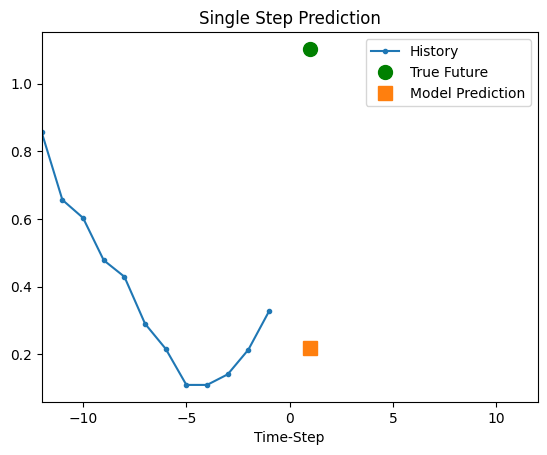

8/8 [==============================] - 0s 2ms/step


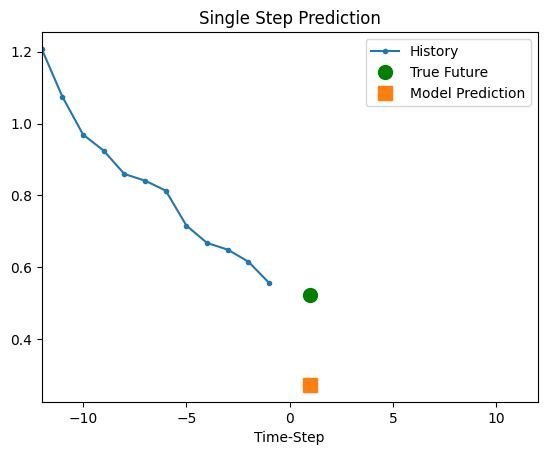

8/8 [==============================] - 0s 3ms/step


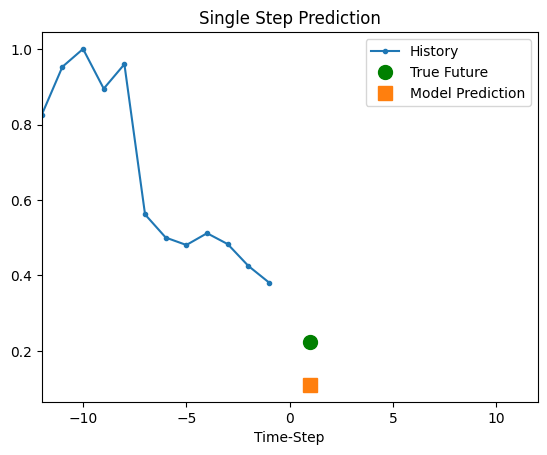

8/8 [==============================] - 0s 2ms/step


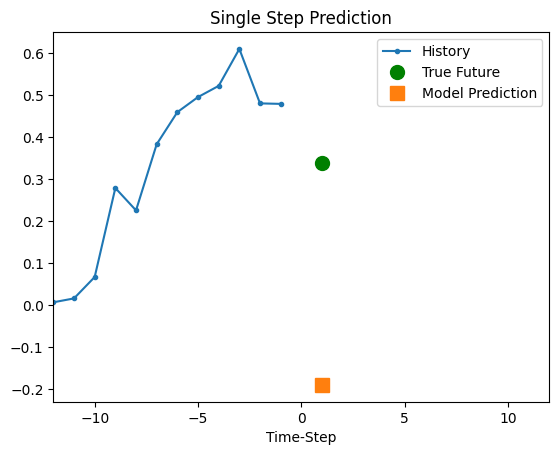

8/8 [==============================] - 0s 2ms/step


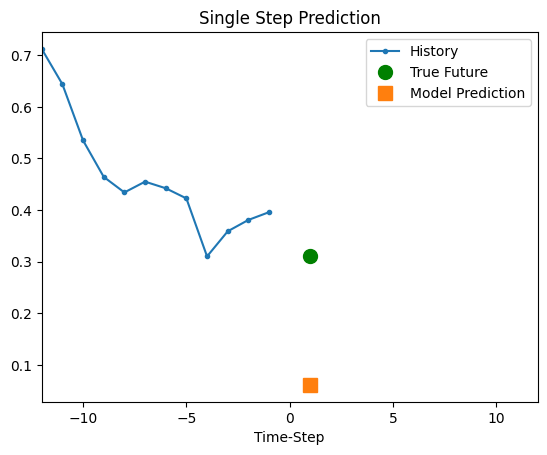

In [ ]:
%matplotlib inline
def show_plot(plot_data, delta, title):
    labels = ["History", "True Future", "Model Prediction"]
    marker = [".-", "go", "s"]
    time_steps = list(range(-(plot_data[0].shape[0]), 0))

    plt.title(title)
    for i, val in enumerate(plot_data):
      if i:
        plt.plot(delta, plot_data[i], marker[i], markersize=10, label=labels[i])
      else:
        plt.plot(time_steps, plot_data[i].flatten(), marker[i], label=labels[i])
    plt.legend()
    plt.xlim([time_steps[0], (delta + 5) * 2])
    plt.xlabel("Time-Step")
    plt.show()
    return


for x, y in dataset_val.take(5):
    show_plot(
        [x[0][:, 1].numpy(), y[0].numpy(), model2.predict(x)[0]],
        1,
        "Single Step Prediction",
    )

#Evaluation

In [ ]:
# Evaluate the models on the test set
test_loss1 = model.evaluate(dataset_test)
test_loss2 = model2.evaluate(dataset_test)

# Compare the performance of the models
print(f"Model 1 test loss: {test_loss1:.4f}")
print(f"Model 2 test loss: {test_loss2:.4f}")

468/468 [==============================] - 14s 31ms/step - loss: 0.8884
Model 1 test loss: 0.1302
Model 2 test loss: 0.8884


According to the loss and evaluation model 1 is better

#Bonus

In [ ]:
predictions1 = model.predict(dataset_test)
predictions2 = model2.predict(dataset_test)

468/468 [==============================] - 14s 30ms/step


In [ ]:
actual_labels = y_test.values.flatten()

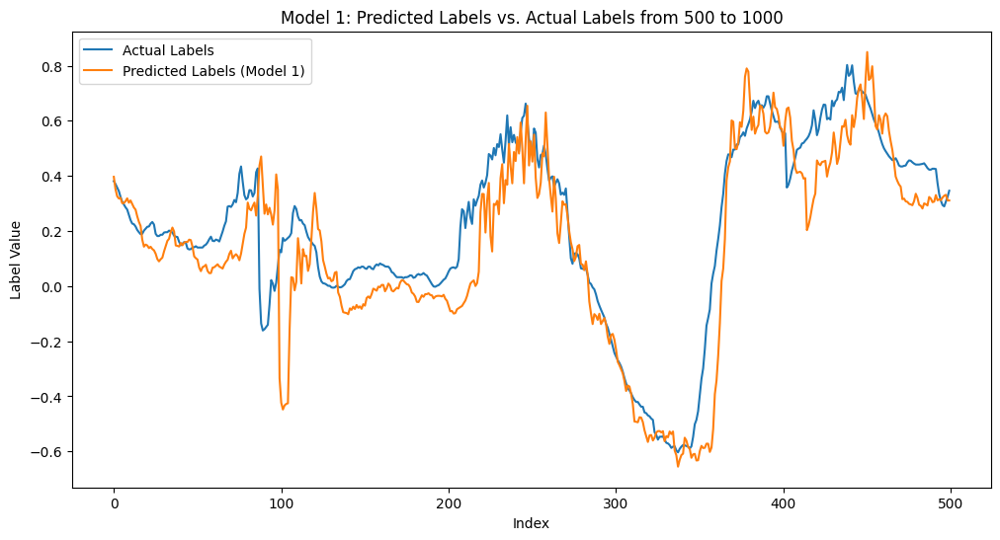

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(actual_labels[500:1000], label='Actual Labels')
plt.plot(predictions1[500:1000], label='Predicted Labels (Model 1)')
plt.xlabel('Index')
plt.ylabel('Label Value')
plt.legend()
plt.title('Model 1: Predicted Labels vs. Actual Labels from 500 to 1000')
plt.show()

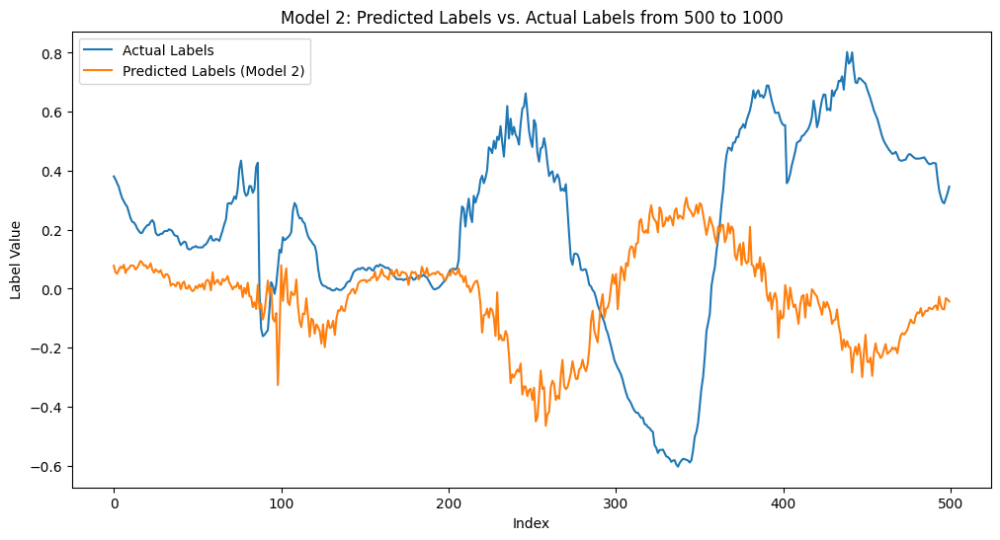

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(actual_labels[500:1000], label='Actual Labels')
plt.plot(predictions2[500:1000], label='Predicted Labels (Model 2)')
plt.xlabel('Index')
plt.ylabel('Label Value')
plt.title('Model 2: Predicted Labels vs. Actual Labels from 500 to 1000')
plt.legend()
plt.show()
